# 5) Tissue Area Segmentation

Adapted from: https://github.com/keiserlab/plaquebox-paper/blob/master/5.1)%20Whole%20Slide%20Scoring%20-%20Tissue%20Area%20WSI%20Segmentation.ipynb

Tissue segmentation against the slide background was performed in the lightness-chroma-hue (LCH) colorspace using a specific colormask for each WSI. Morphological opening and closing operations were performed to smooth the binary masks, and the tissue areas were the pixel sum of refined masks.

In [1]:
# all imports needed
import os
import pandas as pd
import numpy as np
import pyvips as Vips
import matplotlib.pyplot as plt
import sys
import json
from os.path import join as oj
import imageio

#### <center>Functions</center>

#### Global parameters

In [3]:
# from https://github.com/jcupitt/libvips/blob/master/doc/Examples.md
NP_DTYPE_TO_VIPS_FORMAT = {
        np.dtype('int8'): Vips.BandFormat.CHAR,
        np.dtype('uint8'): Vips.BandFormat.UCHAR,
        np.dtype('int16'): Vips.BandFormat.SHORT,
        np.dtype('uint16'): Vips.BandFormat.USHORT,
        np.dtype('int32'): Vips.BandFormat.INT,
        np.dtype('float32'): Vips.BandFormat.FLOAT,
        np.dtype('float64'): Vips.BandFormat.DOUBLE
    }
VIPS_FORMAT_TO_NP_DTYPE = {v:k for k, v in NP_DTYPE_TO_VIPS_FORMAT.items()}

LARGE_KERNEL= [[128, 128, 255, 128, 128],
               [128, 128, 255, 128, 128],
               [255, 255, 255, 255, 255],
               [128, 128, 255, 128, 128],
               [128, 128, 255, 128, 128]]


def array_vips(vips_image, verbose=False):
    dtype = VIPS_FORMAT_TO_NP_DTYPE[vips_image.format]
    if verbose:
        # (height, width, channels)
        print("dtype: {}, shape: ({}, {}, {})".
            format(dtype, vips_image.height, vips_image.width, vips_image.bands)
        )
    return (np.frombuffer(vips_image.write_to_memory(), dtype=dtype).
        reshape(vips_image.height, vips_image.width, vips_image.bands))
    

def show_vips(vips_image, ax=plt, show=True, verbose=False):
    if not isinstance(vips_image, Vips.Image):
        return -1
    
    im_np = array_vips(vips_image)
    if verbose:
        print(im_np.shape)
    if vips_image.bands == 1:
        ax.imshow(im_np.squeeze()/np.max(im_np), cmap=plt.get_cmap('gist_ncar'))
    elif vips_image.bands == 2:
        im_np = im_np[:,:,1]
        ax.imshow(im_np/np.max(im_np), cmap=plt.get_cmap('gray'))
    else:
        ax.imshow(im_np)
    if show:
        plt.show()
    
    
def image_fields_dict(im_with_fields):
    return {k:im_with_fields.get(k) 
            for k in im_with_fields.get_fields() 
            if im_with_fields.get_typeof(k)}


def opening(mask, iterations=1,
            kernel=[[128, 128, 255, 128, 128],
                    [128, 128, 255, 128, 128],
                    [255, 255, 255, 255, 255],
                    [128, 128, 255, 128, 128],
                    [128, 128, 255, 128, 128]]):
    """
    mask is a Vips Image
    """
    for iteration in range(iterations):
        mask = mask.erode(kernel)
        mask = mask.dilate(kernel)
    return mask


def closing(mask, iterations=1,
            kernel=[[128, 128, 255, 128, 128],
                    [128, 128, 255, 128, 128],
                    [255, 255, 255, 255, 255],
                    [128, 128, 255, 128, 128],
                    [128, 128, 255, 128, 128]]):
    """
    mask is a Vips Image
    """
    for iteration in range(iterations):
        mask = mask.dilate(kernel)
        mask = mask.erode(kernel)
    return mask


def mask_background(img, lightness=[-0.1,9999.], chroma=[6.0, 20.], hue=[-0.1,9999.], chroma_thresh=1):
    """
    img is a Vips Image
    """    
    im_colorspace  = img.colourspace('VIPS_INTERPRETATION_LCH')
    
    lightness_mask = (im_colorspace[0] > lightness[0]) & \
                     (im_colorspace[0] < lightness[1])
    
    chroma_mask    = (im_colorspace[1] > chroma[0]) & \
                     (im_colorspace[1] < chroma[1])

    hue_mask       = (im_colorspace[2] > hue[0]) & \
                     (im_colorspace[2] < hue[1])        
            
    mask = lightness_mask & chroma_mask & hue_mask
    
    mask = closing(mask, iterations=2)
    mask = opening(mask, iterations=1)
    return mask

    
def plot_arrays(im, mask, name):
    fig, ax = plt.subplots(ncols=2, figsize=(10, 4))
    ax[0].imshow(im[:,:,:3])
    ax[0].set_title(name, fontweight="bold", fontsize=16)
    ax[1].imshow(mask.squeeze()/np.max(mask), cmap=plt.get_cmap("gist_ncar"))
    plt.show()
    
    
def segment_tissue_area(wsi_path, params, level=2, resize=False, show=False):
    """Perform LHC color space thresholding to segment tissue area of a AB stained WSI at low res.
    
    :param wsi_path : str
        path to WSI image
    :param params : dict
        dict with lightness, chroma, and hue low and upper values (list) for thresholding image
    :param level : int (default: 2)
        level to to get image at, 0 is full res
    :param resize : bool (default: False)
        if True the image is resized by half its resolution before thresholding
    :param show : bool (default: False)
        plot the results if True
        
    :return area_count : int
        number of pixels in the tissue segmented mask
    """
    # get low res image
    vips_im = Vips.Image.new_from_file(wsi_path, level=level)
    
    vips_mask = mask_background(vips_im, lightness=params['lightness'], chroma=params['chroma'],
                               hue=params['hue'])
    
    # convert to numpy array
    arr_mask = array_vips(vips_mask)

    area_count = float((arr_mask > 0).sum())
    if resize:
        area_count /= 4  # half the resolution, divide by 4 

    if show:
        arr_im = array_vips(vips_im)
        plot_arrays(arr_im, arr_mask, wsi_path.split('/')[-1])
        
    return int(area_count), arr_mask
    

#### <center>Parameters</center>


In [4]:
"""***Parameters***"""
csv_paths = ['../CSVs/Emory_data_RAW.csv', '../CSVs/Tang_data_RAW.csv']
save_paths = ['../CSVs/Emory_data.csv', '../CSVs/Tang_data.csv']
wsi_dir = "/mnt/Data/wsi/"
param_json = '../jsons/hcl_params.json'
save_dir = '/mnt/Data/outputs/tissue_masks/'

# name of images scanned at 40x to resize to 20x
RESIZE = ["NA5005-02_AB", "NA4053-02_AB", "NA4129-2_AB", "NA4133_2_AB", "NA4156-2_AB",
    "NA4167-2_AB", "NA4853-02_AB17-24", "NA4953-02_AB17-24", "NA4954-02_AB17-24",
    "NA4964-02_AB17-24", "NA4974-02_AB17-24", "NA4963-02_AB17-24"]

os.makedirs(save_dir, exist_ok=True)

with open(param_json, 'rb') as fp:
    params = json.load(fp)

# get svs file paths in wsi_dir as named dict
file_paths = {}
for r, d, f in os.walk(wsi_dir):
    for file in f:
        if '.svs' in file:
            file_paths[file.replace('.svs', '')] = oj(r, file)


#### <center>Run</center>

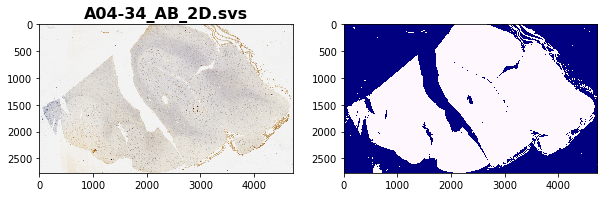

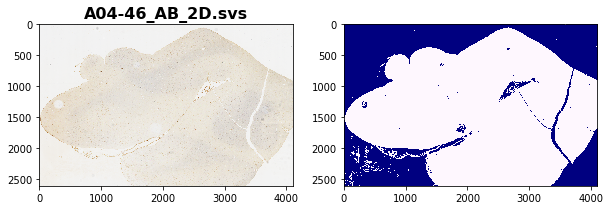

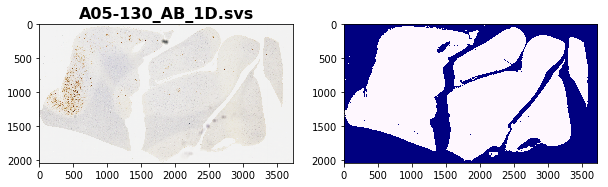

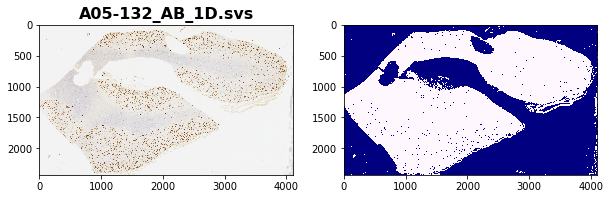

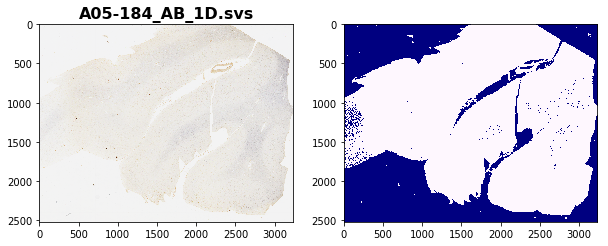

...

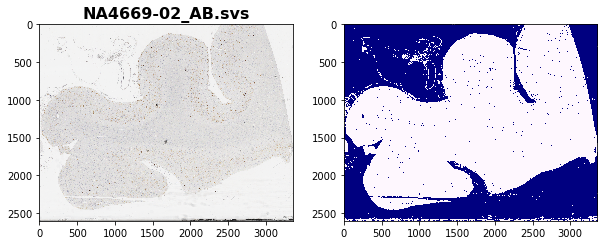

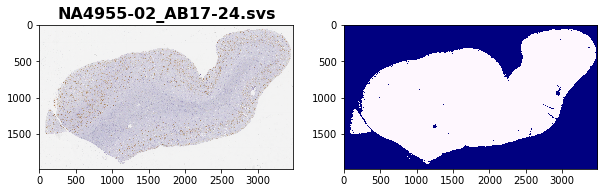

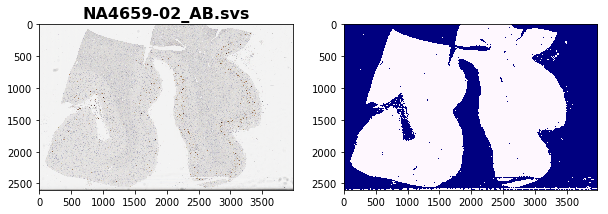

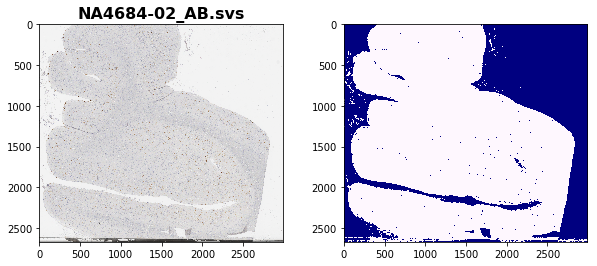

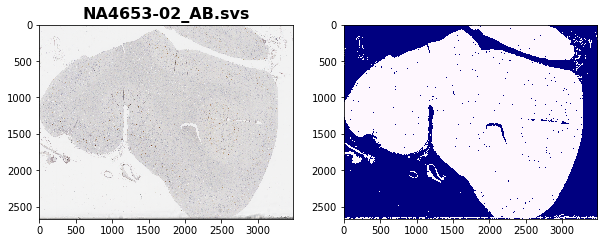

In [6]:
# for each csv, add the tissue area column
for idx, csv_path in enumerate(csv_paths):
    df = pd.read_csv(csv_path)
    
    tissue_areas = []
    for i, r in df.iterrows():
        filename = r['WSI_ID']
        
        p = params[filename]

            
        file_path = file_paths[filename]
        
        if filename in RESIZE:
            resize = True
        else:
            resize = False
            
        area_count, mask = segment_tissue_area(file_path, p, show=True, resize=resize)
        tissue_areas.append( area_count )
        
        # save mask as image
        imageio.imwrite(oj(save_dir, filename + '.png'), mask[:, :, 0])
      
    # add area column
    df['tissue_px_count'] = tissue_areas
    
    # save the df
    df.to_csv(save_paths[idx], index=False)
    
